In [1]:
from gaussian import *
from gaussian_blur import *

/beegfs/desy/user/hailudaw/anacon/envs/topo/lib/python3.11/site-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(


In [39]:

def get_row_col(images, show_all = False):
    if show_all:
        rows = int(np.sqrt(len(images)))
        cols = int(np.sqrt(len(images)))
        return rows, cols + (len(images) - rows*cols)//rows
    
    if len(images) == 1:
        rows = 1
        cols = 1
    elif len(images) <= 5:
        rows = 1
        cols = len(images)
    else:
        rows = 2
        cols = len(images)//2
    if rows*cols > len(images):
        images = images[:rows*cols - int(rows*cols/len(images))]
        print('rows: ', rows, 'cols: ', cols, 'images: ', len(images))
        rows, cols = get_row_col(images)
    print('rows: ', rows, 'cols: ', cols)
    return rows, cols

def plot_pandas(df, column_range = None, x_column = None, titles = None):
    """
    this function plots the metadata dataframe
    """
    if column_range is None:
        column_range = df.columns[2:-1]
    elif column_range == 'all':
        column_range = df.columns
    elif type(column_range) is str:
        column_range = [column_range]
    elif type(column_range) is int:
        column_range = df.columns[column_range:-1]

    rows, cols = get_row_col(column_range)
    print('rows: ', rows, 'cols: ', cols)
    if rows*cols < 6:  
        fig = plt.figure(figsize=(10,5))
    else:
        fig = plt.figure(figsize=(20,10))
    min_vals = [df[column].min() for column in column_range], [df[column].idxmin() for column in column_range]
    max_vals = [df[column].max() for column in column_range], [df[column].idxmax() for column in column_range]
    if titles is None:
        # titles = [column + '\nmin = ' + str(min_per_column[i])+' at ' + str(df[column].idxmin()) +'\n max = ' + str(df[column].max())+' at ' + str(df[column].idxmax()) for i, column in enumerate(column_range)]
        titles = [column + '\nmin = ' + str(min_vals[0][i])+' at ' + str(min_vals[1][i]) +'\n max = ' + str(max_vals[0][i])+' at ' + str(max_vals[1][i]) for i, column in enumerate(column_range)]

    

    for i, column in enumerate(column_range):
        ax = fig.add_subplot(rows, cols, i+1)
        if x_column is None:
            ax.plot(df[column])
            ax.set_xlabel('iterations')
            ax.set_ylabel(column)
            ax.set_title(titles[i])
        else:
            ax.plot(df[x_column], df[column])
            ax.set_xlabel(x_column)
            ax.set_ylabel(column)
            ax.set_title(titles[i])
    plt.tight_layout()
    return min_vals, max_vals

def plot_image(plots, idx = None, title = '', fig = None, ax = None):
    if type(plots) is not list:
            plots = [plots]
    if idx is not None:
        plots = [plots[i] for i in idx]
    title = give_titles(plots, title)
    fig_size = (5,10) if len(plots) > 1 else (5,5)
    fig = plt.figure(figsize=fig_size) if fig is None else fig
    ax = fig.add_subplot(111)
    [ax.plot(plots[i]) for i in range(len(plots))]
    ax.set_title(title)
    ax.legend(title)
    plt.show()
    return fig, ax

# class Gaussian_challenge(nn.Module):
#     def __init__(self, img: torch.Tensor, kernel_size: List[int], sigma: List[float], device: Optional[torch.device] = None) -> None:
#         super().__init__()
#         if not (isinstance(img, torch.Tensor)):
#             img = torch_reshape(img)
#         self.kernel_size = kernel_size
#         self.sigma = sigma
#         self.device = device if device is not None else img.
#         self.dtype = img.dtype if torch.is_floating_point(img) else torch.float32
#         self.shape = list(img.shape)

#         self.kernel = _get_gaussian_kernel2d(kernel_size, sigma, dtype=self.dtype, device=device)
#         self.kernel = self.kernel.expand(self.shape[-3], 1, self.kernel.shape[0], self.kernel.shape[1])
#         img, self.need_cast, self.need_squeeze, out_dtype = _cast_squeeze_in(img, [self.kernel.dtype])
#         self.kernel = _cast_squeeze_out(self.kernel, self.need_cast, self.need_squeeze, out_dtype)
        
#         self.kernel = self.kernel.to(self.device)


#     def forward(self, img: Tensor) -> Tensor:
#         if not (isinstance(img, torch.Tensor)):
#             img = torch_reshape(img)
#         if self.shape != list(img.shape) or self.dtype != img.dtype or self.device != img.device:
#             Warning('img shape, dtype or device is not the same as the initialized one')
#             new_self = Gaussian_challenge(img, self.kernel_size, self.sigma, device = img.device)
#             padding = [new_self.kernel_size[0] // 2, new_self.kernel_size[0] // 2, new_self.kernel_size[1] // 2, new_self.kernel_size[1] // 2]
#             img = torch_pad(img, padding, mode="reflect")
#             blurred = conv2d(img, new_self.kernel, groups=img.shape[-3])
#             return _cast_squeeze_out(blurred, new_self.need_cast, new_self.need_squeeze, new_self.dtype)
#         else:
#             padding = [self.kernel_size[0] // 2, self.kernel_size[0] // 2, self.kernel_size[1] // 2, self.kernel_size[1] // 2]
#             img = torch_pad(img, padding, mode="reflect")
#             blurred = conv2d(img, self.kernel, groups=img.shape[-3])
#             return _cast_squeeze_out(blurred, self.need_cast, self.need_squeeze, self.dtype)
    
class make_ganrec_model(nn.Module):
    def __init__(self, shape_x, shape_y, conv_num, conv_size, dropout, output_num, fresnel_factor, transformed_images=None, device=None, **kwargs):
        super(make_ganrec_model, self).__init__()
        for key, value in kwargs.items():
            setattr(self, key, value)
        self.device = device
        if self.device is None:
            self.device = torch.device("cuda:4" if torch.cuda.is_available() else "cpu")
        
        self.base_coeff = to_device(torch_reshape(self.base_coeff, complex=True), self.device) if self.base_coeff is not None else None
        self.fresnel_factor = to_device(torch_reshape(fresnel_factor, complex=True), self.device) if fresnel_factor is not None else None
        self.transformed_images = to_device(transformed_images, self.device) 
        self.image = to_device(self.image, self.device)
        self.shape_x = shape_x
        self.shape_y = shape_y
        self.conv_num = conv_num
        self.conv_size = conv_size
        self.dropout = dropout
        self.output_num = output_num
        self.units = kwargs['units'] if 'units' in kwargs.keys() else 128
        self.fc_size = shape_x * shape_y
        self.task = kwargs['task'] if 'task' in kwargs.keys() else 'phase_retrieval'
        if 'ground_truth' in kwargs.keys() and kwargs['ground_truth'] is not None:
            self.ground_truth = to_device(self.transform(kwargs['ground_truth']), self.device)
        else:
            self.ground_truth = None
        random.seed(self.seed)
        torch.manual_seed(self.seed)
        torch.cuda.manual_seed(self.seed)
        torch.cuda.manual_seed_all(self.seed)
        np.random.seed(self.seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = True
        
        if 'mode' in kwargs.keys():
            self.mode = kwargs['mode']
        else:
            self.mode = 'constant'
        if 'value' in kwargs.keys():
            self.value = kwargs['value']
        else:
            self.value = 'mean'
        if 'abs_ratio' in kwargs.keys():
            self.abs_ratio = kwargs['abs_ratio']
        else:
            self.abs_ratio = 1
        ##################################################################################################
        # We first define the generator model
        ##################################################################################################
        
        
        if self.fc_depth == 0:
            self.fc_stack = []
        else:
            units = [self.units]*self.fc_depth
            self.fc_submodule = nn.ModuleList([
                dense_layer(in_features=self.units, out_features=self.units, dropout=self.dropout) for i in range(len(units))
            ])
            self.fc_stack = nn.ModuleList([
                nn.Flatten(),
                Transpose(),
                dense_layer(in_features=1, out_features=self.units, dropout=self.dropout, transpose=False),
                *self.fc_submodule,
                dense_layer(in_features=self.units, out_features=1, dropout=0),
                Reshape((-1, 1, self.shape_x, self.shape_y)),
            ])
        
    

        if self.cnn_depth == 0:
            self.cnn_stack = []
        else:
            conv_size_add_list = list(np.arange(1,self.cnn_depth+1))
            deconv_size_add_list = list(np.arange(self.cnn_depth, 0, -1))
            self.conv_stack = nn.ModuleList([
                conv2d_layer(in_channels=conv_num, out_channels=self.conv_num, kernel_size=self.conv_size+conv_size_add_list[i], stride=1, apply_batchnorm=True, normal_init=True) for i in range(len(conv_size_add_list))
            ])

            self.dconv_stack = nn.ModuleList([
                deconv2d_layer(in_channels=self.conv_num, out_channels=self.conv_num, kernel_size=self.conv_size+deconv_size_add_list[i], stride=1, apply_batchnorm=True, normal_init=True) for i in range(len(deconv_size_add_list))
            ])

            self.downsample = nn.MaxPool2d(2, 2)
            self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

            self.cnn_stack = nn.ModuleList([      
                conv2d_layer(in_channels=1, out_channels=self.conv_num, kernel_size=self.conv_size, stride=1), 
                *self.conv_stack[0:],
                self.downsample,
                *self.dconv_stack,
                deconv2d_layer(in_channels=self.conv_num, out_channels=self.output_num, kernel_size=self.conv_size, stride=1),
            ])
        
        if self.depth == 0:
            self.generator_model = to_device(nn.Sequential(
                *self.fc_stack,
                *self.cnn_stack,
            ), self.device)
        else:
            self.generator_model = to_device(nn.Sequential(*self.fc_stack, UNet(n_channels=1, n_classes=self.output_num, bilinear=True)), self.device)

        if 'init_model' in kwargs.keys():
            if kwargs['init_model']:
                # Load the model
                init_model_path = kwargs.get('init_model_path', 'model/ganrec_model')
                self.generator_model.load_state_dict(torch.load(init_model_path))

        else:
            self.init_weights()

        ##################################################################################################
        # We then define the discriminator model
        ##################################################################################################
        in_channels_list = list(2**np.arange(self.dis_depth)) # [1, 16, 16, 32, 32]
        out_channels_list =list(2**np.arange(1,self.dis_depth+1)) #[16, 16, 32, 32, 64]
        kernel_size_list = [self.conv_num]*len(in_channels_list) #[3,3,3,3,3]
        stride_list = [1]*len(in_channels_list) #[2,2,2,2,2]
        discriminator_stack = nn.ModuleList([
            conv2d_layer(in_channels=in_channels_list[i], out_channels=out_channels_list[i], kernel_size=kernel_size_list[i], stride=stride_list[i]) for i in range(len(in_channels_list))
        ])

        self.discriminator_model =  to_device(nn.Sequential(
            *discriminator_stack,
            nn.Flatten(),
        ), self.device)

        if 'task' not in kwargs.keys():
            self.task = 'phase_retrieval'

        if self.task == 'learn_gaussian':
            self.gaussian_filter = to_device(Gaussian_challenge(self.transformed_images, kernel_size=self.gaussian_kernel_size, sigma=self.sigma), self.device)
            # self.gaussian_filter = to_device(T.GaussianBlur(kernel_size=self.gaussian_kernel_size, sigma=self.sigma), self.device)

        self.ssim = to_device(SSIM(), self.device)
        self.psnr = to_device(PSNR(), self.device)
        self.mssim = to_device(mSSIM(), self.device)
        # self.fid.update(self.transformed_images, real=True)
        


        self.reshaped = to_device(transform(self.transformed_images, 'reshape') , self.device)
        self.normalized = transform(self.reshaped, 'normalize')
        self.norm = transform(self.reshaped, 'norm')
        self.contrast = transform(self.reshaped, 'contrast', self.transform_factor)
        self.contrast_normalize = transform(self.reshaped, 'constrast_normalize', self.transform_factor)
        self.brightness = transform(self.reshaped, 'brightness', self.transform_factor)
        self.brightness_normalize = transform(self.reshaped, 'brightness_normalize', self.transform_factor)
        self.fourier = torch.fft.fft2(self.reshaped)

    def init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    init.zeros_(m.bias)

    def refine_parameters_using_condition(self, condition = None, values = None, change_from_soure = False, info = None, ratio = None, plot_pd=False, show_images=False):
        if ratio is None:
            ratio = {'l1_ratio': 10, 'contrast_ratio': 0, 'normalized_ratio': 5, 'brightness_ratio': 0, 'contrast_normalize_ratio': 0, 'brightness_normalize_ratio': 0, 'l2_ratio': 0, 'fourier_ratio': 0}
        
        
        
        last_unblurred_images = []
        last_phases = []
        last_atts = []
        last_props = []

        if type(ratio) is list:
            df = pd.DataFrame(columns=['iter_num', 'gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'mssim_list', 'setup_info'])
            df.index.name = 'ratios'
            
            for i, r in enumerate(ratio):
                model = make_ganrec_model(**self.__dict__)
                if self.task == 'learn_gaussian':
                    model.train(save_model = False, save_model_path = 'model/ganrec_model', **r)
                    last_unblurred_images.append(model.unblurred_list[-1])
                    last_props.append(model.propagated_intensity_list[-1])
                    
                else:
                    model.train(save_model = False, save_model_path = 'model/ganrec_model', **r)
                    last_phases.append(model.phase_list[-1])
                    last_atts.append(model.attenuation_list[-1])
                    last_props.append(model.propagated_intensity_list[-1])

                print('gen_loss: ', model.gen_loss_list[-1], 'dis_loss: ', model.dis_loss_list[-1], 'main_diff: ', model.main_diff_list[-1])
                df.loc[i, 'iter_num'] = len(model.gen_loss_list)
                df.loc[i, 'gen_loss'] = model.gen_loss_list[-1]
                df.loc[i, 'dis_loss'] = model.dis_loss_list[-1]
                df.loc[i, 'main_diff'] = model.main_diff_list[-1]
                df.loc[i, 'ssim_list'] = model.ssim_list[-1]
                df.loc[i, 'psnr_list'] = model.psnr_list[-1]
                df.loc[i, 'mssim_list'] = model.mssim_list[-1]
                df.loc[i, 'setup_info'] = get_file_nem(model.__dict__)
            #replace nan values with 0
            df = df.fillna(0)
            column_range = ['main_diff', 'gen_loss', 'dis_loss', 'ssim_list', 'psnr_list', 'mssim_list']
            #list_element.index(element)
            min_vals = [df[column].min() for column in column_range], [df[column].idxmin() for column in column_range]
            max_vals = [df[column].max() for column in column_range], [df[column].idxmax() for column in column_range]
            
            if plot_pd:         
                plot_pandas(df, column_range=column_range)
            if show_images:
                if self.task == 'learn_gaussian':
                    visualize(last_unblurred_images, title = ['unblurred_' + str(i) for i in range(len(last_unblurred_images))], rows = int(np.sqrt(len(last_unblurred_images))), cols = int(np.sqrt(len(last_unblurred_images))))
                    visualize(last_props, title = ['propagated_intensity_' + str(i) for i in range(len(last_props))], rows = int(np.sqrt(len(last_unblurred_images))), cols = int(np.sqrt(len(last_unblurred_images))) )
                else:
                    visualize(last_props, title = ['propagated_intensity_' + str(i) for i in range(len(last_props))])
                    visualize(last_phases, title = ['phase_' + str(i) for i in range(len(last_phases))])

            if self.task == 'learn_gaussian':
                return df, last_unblurred_images, last_props, min_vals, max_vals
            else:
                return df, last_props, last_phases, last_atts, min_vals, max_vals
        
        df = pd.DataFrame(columns=[condition, 'iter_num', 'gen_loss', 'dis_loss', 'main_diff',  'setup_info'])
        df.index.name = condition

        if type(values) is not list:
            values = [values]

        for value in values:        
            if change_from_soure == True:
                info[condition] = value if condition in info.keys() else info.update({condition: value})
                new_dataloader = Ganrec_Dataloader(**info)
                model = make_ganrec_model(**new_dataloader.__dict__)
            else:
                kwargs = self.__dict__
                kwargs[condition] = value if condition in kwargs.keys() else kwargs.update({condition: value})
                model = make_ganrec_model(**kwargs)
            if self.task == 'learn_gaussian':
                gen_loss_list, dis_loss_list, propagated_intensity_list, unblurred_images_list = model.train(save_model = False, save_model_path = 'model/ganrec_model', **ratio)
            else:
                gen_loss_list, dis_loss_list, propagated_intensity_list, phase_list, attenuation_list = model.train(save_model = False, save_model_path = 'model/ganrec_model', **ratio)
            
            print('gen_loss: ', gen_loss_list[-1], 'dis_loss: ', dis_loss_list[-1], 'main_diff: ', model.main_diff_list[-1])
            df.loc[value, condition] = value
            df.loc[value, 'iter_num'] = len(gen_loss_list)
            df.loc[value, 'gen_loss'] = gen_loss_list[-1]
            df.loc[value, 'dis_loss'] = dis_loss_list[-1]
            df.loc[value, 'main_diff'] = model.main_diff_list[-1]
            df.loc[value, 'setup_info'] = get_file_nem(model.__dict__)
            last_props.append(propagated_intensity_list[-1])
            if self.task == 'learn_gaussian':
                last_unblurred_images.append(unblurred_images_list[-1])
            else:
                last_phases.append(phase_list[-1])
                last_atts.append(attenuation_list[-1])
        column_range = ['main_diff', 'gen_loss', 'dis_loss']
        #list_element.index(element)
        min_vals = [df[column].min() for column in column_range], [df[column].idxmin() for column in column_range]
        max_vals = [df[column].max() for column in column_range], [df[column].idxmax() for column in column_range]
        indices_in_values = [values.index(min_vals[1][i]) for i in range(len(min_vals[1]))] 
        if plot_pandas:         
            plot_pandas(df, column_range, x_column = condition)
        if show_images:
            if self.task == 'learn_gaussian':
                visualize([last_unblurred_images[-1], last_props[-1]], title = ['unblurred', 'propagated_intensity'])
            else:
                visualize([last_props[-1], last_phases[-1], last_atts[-1]], title = ['propagated_intensity', 'phase', 'attenuation'])
        return df, last_props, last_phases, last_atts, min_vals, max_vals, indices_in_values

    def make_model(self):
        # self.generator = self.generator_model
        # self.discriminator = self.discriminator_model

        if 'task' in self.__dict__.keys() and self.task == 'learn_gaussian':
            if 'g_learning_rate' not in self.__dict__.keys():
                self.g_learning_rate = 1e-5
            if 'd_learning_rate' not in self.__dict__.keys():
                self.d_learning_rate = 1e-8
            if 'weight_decay' not in self.__dict__.keys():
                self.weight_decay = 1e-8
            if 'momentum' not in self.__dict__.keys():
                self.momentum = 0.9
            if 'amp' not in self.__dict__.keys():
                self.amp = False

            self.generator_optimizer = optim.RAdam(self.generator_model.parameters(),lr=self.g_learning_rate, weight_decay=self.weight_decay)
            self.discriminator_optimizer = optim.Adam(self.discriminator_model.parameters(), lr=self.d_learning_rate, weight_decay=self.weight_decay, amsgrad=True, maximize=True)
            
            self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(self.generator_optimizer, 'min', patience=5)  # goal: maximize Dice score
            self.grad_scaler = torch.cuda.amp.GradScaler(enabled=self.amp)    
        else:
            self.generator_optimizer = torch.optim.Adam(self.generator_model.parameters(), lr=1e-1)
            self.discriminator_optimizer = torch.optim.Adam(self.discriminator_model.parameters(), lr=1e-2)
        
    def forward_generator(self, x):
        self.pred = self.generator_model(x)
        return self.pred

    def forward_discriminator(self, x):
        self.likelihood = self.discriminator_model(x)
        return self.likelihood
    
    def transform(self, x):
        if 'transform_type' in self.kwargs.keys():
            transform_type = self.transform_type
        else:
            transform_type = 'normalize'

        if 'transform_factor' in self.kwargs.keys():
            transform_factor = self.transform_factor
        else:
            transform_factor = 0.1
        return transform(x, transform_type, transform_factor)

    def propagator(self):
        phase = transform(self.pred[:,0,:,:], 'normalize') #*2 -1) * torch.pi
        attenuation =  (1 - transform(self.pred[:,1,:,:], 'normalize'))*self.abs_ratio
        propagated_intensity = transform(forward_propagate(shape_x = self.shape_x, shape_y = self.shape_y, pad = self.pad, energy_kev = self.energy_kev, detector_pixel_size = self.detector_pixel_size, distance_sample_detector = self.distance_sample_detector, phase_image = phase, attenuation_image = attenuation, fresnel_factor  = self.fresnel_factor, wavefield = None, distance =  self.distance_sample_detector, mode = self.mode, value = self.value), self.transform_type, self.transform_factor)
        self.difference = propagated_intensity - self.transformed_images
        self.main_diff = torch.mean(torch.abs(self.difference))

        return propagated_intensity, phase, attenuation
    
    def gaussian_conv(self, x = None):
        if x is None:
            x = self.transform(self.pred)
        else:
            if self.output_num == 1:
                x = transform(x, 'reshape')
            elif self.output_num == 2:
                self.phase = x[:,0,:,:]
                self.attenuation = x[:,1,:,:]
                self.modulus = torch_reshape(torch.abs(torch.exp(1j*self.phase) * torch.exp(-self.attenuation))**2)
                x = torch_reshape(self.phase)
            # x = self.transform(x)
        self.blurred = to_device(self.transform(self.gaussian_filter(x)), self.device)
        self.difference = self.blurred - self.transformed_images
        if self.l1_ratio != 0:
            self.main_diff = torch.mean(torch.abs(self.difference))
        else:
            self.main_diff = torch.mean(torch.square(self.difference))
        return self.blurred, x
        
    
    def forward(self, x = None):
        x = self.transformed_images if x is None else x
        self.pred = self.generator_model(x)
        propagated_intensity, phase, attenuation = self.propagator()
        self.fake_output = self.discriminator_model(propagated_intensity)
        self.real_output = self.discriminator_model(x)
        return self.fake_output, self.real_output, propagated_intensity, phase, attenuation
    
    def forward_gaussian(self, x):
        self.pred = self.generator_model(x)
        self.propagated_intensity, self.unblurred = self.gaussian_conv(self.pred)
        self.fake_output = self.discriminator_model(self.propagated_intensity)
        self.real_output = self.discriminator_model(x)
        return self.fake_output, self.real_output, self.propagated_intensity, self.unblurred
    

    def generator_loss(self, fake_output, x, propagated_intensity):
        cross_entropy = torch.mean(torch.nn.BCEWithLogitsLoss()(fake_output, torch.ones_like(fake_output)))
        if self.l1_ratio == 0:
            l2_loss = self.main_diff if self.l2_ratio != 0 else 0
            l1_loss = 0
        else:
            l1_loss =self.main_diff if self.l1_ratio != 0 else 0
            l2_loss = torch.mean(torch.square(self.difference)) if self.l2_ratio != 0 else 0
        
        contrast_diff = torch.mean(torch.abs(self.contrast - transform(propagated_intensity, 'contrast', self.transform_factor))) if self.contrast_ratio != 0 else 0
        contrast_noramlize_difference = torch.mean(torch.square(self.contrast_normalize - transform(propagated_intensity, 'contrast_normalize', self.transform_factor))) if self.contrast_normalize_ratio != 0 else 0
        brightness_noramlize_difference = torch.mean(torch.square(self.brightness_normalize - transform(propagated_intensity, 'brightness_normalize', 1 - self.transform_factor))) if self.brightness_normalize_ratio != 0 else 0
        brightness_diff = torch.mean(torch.square(self.brightness - transform(propagated_intensity, 'brightness', 1 - self.transform_factor))) if self.brightness_ratio != 0 else 0
        
        norm_diff = torch.mean(torch.abs(self.norm - transform(propagated_intensity, 'norm', self.transform_factor))) if self.norm_ratio != 0 else 0
        normalized_diff = torch.mean(torch.abs(self.normalized - transform(propagated_intensity, 'normalize', self.transform_factor))) if self.normalized_ratio != 0 else 0
        
        #use logaritmic loss for the fourier difference
        fourier_diff_real = torch.mean(torch.square(torch.log(torch.abs(torch.fft.fft2(propagated_intensity).real + 1e-10)))) if self.fourier_ratio != 0 else 0
        fourier_diff_imag = torch.mean(torch.square(torch.log(torch.abs(torch.fft.fft2(propagated_intensity).imag + 1e-10)))) if self.fourier_ratio != 0 else 0
        fourier_diff = fourier_diff_real + fourier_diff_imag
        #we use a truncated - quadratic gradient regularization
        reg_l2_loss = torch.mean(torch.square(self.pred[:, :, 1:, :] - self.pred[:, :, :-1, :])) + torch.mean(torch.square((self.pred[:, :, :, 1:] - self.pred[:, :, :, :-1]))) if self.reg_l2_ratio != 0 else 0
        if reg_l2_loss > 0: 
            reg_l2_loss = 1 if reg_l2_loss >1 else reg_l2_loss
            
        reg_l1_loss = torch.mean(torch.abs(self.pred[:, :, 1:, :] - self.pred[:, :, :-1, :])) + torch.mean(torch.abs((self.pred[:, :, :, 1:] - self.pred[:, :, :, :-1]))) if self.reg_l1_ratio != 0 else 0
        
        #if self.modulus exists, then make sure
        self.final_loss =  self.entropy_ratio * cross_entropy + self.l1_ratio * l1_loss + self.contrast_ratio * contrast_diff + self.norm_ratio * norm_diff + self.normalized_ratio * normalized_diff + self.brightness_ratio * brightness_diff + self.contrast_normalize_ratio * contrast_noramlize_difference + self.brightness_normalize_ratio * brightness_noramlize_difference + self.l2_ratio * l2_loss + self.fourier_ratio * fourier_diff
        return self.final_loss + reg_l2_loss * self.reg_l2_ratio + reg_l1_loss * self.reg_l1_ratio
    
    def discriminator_loss(self, real_output, fake_output):
        real_loss = torch.mean(torch.nn.BCEWithLogitsLoss()(real_output, torch.ones_like(real_output)))
        fake_loss = torch.mean(torch.nn.BCEWithLogitsLoss()(fake_output, torch.zeros_like(fake_output)))
        self.total_loss = self.real_loss_ratio * real_loss + self.fake_loss_ratio * fake_loss
        return self.total_loss
    
    def train_step(self, x):
        self.generator_optimizer.zero_grad()
        self.discriminator_optimizer.zero_grad()
        if self.task == 'learn_gaussian':
            self.fake_output, self.real_output, self.propagated_intensity, self.unblurred = self.forward_gaussian(x)
        else:
            self.fake_output, self.real_output, self.propagated_intensity, self.phase, self.attenuation = self.forward(x)
        self.gen_loss = self.generator_loss(self.fake_output, x, self.propagated_intensity)
        self.dis_loss = self.discriminator_loss(self.real_output, self.fake_output)
        self.gen_loss.backward(retain_graph=True)
        self.dis_loss.backward()
        self.generator_optimizer.step()
        self.discriminator_optimizer.step()
        if self.task == 'learn_gaussian':
            return self.gen_loss, self.dis_loss, self.propagated_intensity, self.unblurred
        else:
            return self.gen_loss, self.dis_loss, self.propagated_intensity, self.phase, self.attenuation
        
    def train(self, iter_num = None, save_model = None, save_model_path = None, **ratio): # l1_ratio = 10, contrast_ratio = 0, normalized_ratio = 0, norm_ratio = 0, brightness_ratio = 0, contrast_normalize_ratio = 0, brightness_normalize_ratio = 0, l2_ratio = 0, fourier_ratio = 0):
        for key, value in ratio.items():
            setattr(self, key, value)
        iter_num = self.iter_num if iter_num is None else iter_num
        save_model = self.save_model if save_model is None else save_model
        save_model_path = self.save_model_path if save_model_path is None else save_model_path

        self.make_model()
        self.gen_loss_list, self.dis_loss_list, self.propagated_intensity_list, self.phase_list, self.attenuation_list, self.main_diff_list, self.epoch_time, self.ssim_list, self.psnr_list, self.mssim_list = [], [], [], [], [], [], [], [], [], []
        self.ground_main_diff_list, self.ground_ssim_list, self.ground_psnr_list, self.ground_mssim_list = [], [], [], []
        if self.task == 'learn_gaussian':
            self.unblurred_list = []

        self.start_time = time.time()  

        stop_training = False
        print('start training')
        for i in range(iter_num):
            self.epoch = i
            if self.task == 'learn_gaussian':
                self.g_loss, self.d_loss, self.propagated_intensity, self.unblurred = self.train_step(self.transformed_images)
                self.unblurred_list.append(tensor_to_np(self.unblurred))
                self.scheduler.step(self.g_loss)

            else:
                self.g_loss, self.d_loss, self.propagated_intensity, self.phase, self.attenuation = self.train_step(self.transformed_images)
                self.phase_list.append(tensor_to_np(self.phase))
                self.attenuation_list.append(tensor_to_np(self.attenuation))
                self.scheduler.step(self.g_loss)

            self.ssim_list.append(tensor_to_np(self.ssim(self.transformed_images, self.propagated_intensity)))
            self.psnr_list.append(tensor_to_np(self.psnr(self.transformed_images, self.propagated_intensity)))
            self.mssim_list.append(tensor_to_np(self.mssim(self.transformed_images, self.propagated_intensity))) 

            if self.ground_truth is not None:
                if self.task == 'learn_gaussian':
                    self.ground_truth_difference = tensor_to_np(self.transform(self.unblurred) - self.transform(self.ground_truth))
                    self.ground_ssim_list.append(tensor_to_np(self.ssim(self.ground_truth, self.unblurred)))
                    self.ground_psnr_list.append(tensor_to_np(self.psnr(self.ground_truth, self.unblurred)))
                    self.ground_mssim_list.append(tensor_to_np(self.mssim(self.ground_truth, self.unblurred)))
                    self.ground_main_diff_list.append(np.mean(np.abs(self.ground_truth_difference)))
                else:
                    self.ground_truth_difference = tensor_to_np(self.phase - self.ground_truth)
                    self.ground_ssim_list.append(tensor_to_np(self.ssim(self.ground_truth, self.phase)))
                    self.ground_psnr_list.append(tensor_to_np(self.psnr(self.ground_truth, self.phase)))
                    self.ground_mssim_list.append(tensor_to_np(self.mssim(self.ground_truth, self.phase)))
                    self.ground_main_diff_list.append(np.mean(np.abs(self.ground_truth_difference)))

            self.gen_loss_list.append(tensor_to_np(self.gen_loss))
            self.dis_loss_list.append(tensor_to_np(self.dis_loss))
            self.main_diff_list.append(tensor_to_np(self.main_diff))
            self.propagated_intensity_list.append(tensor_to_np(self.propagated_intensity))

            
            #no better imporvement for 10 epochs
            if i > 50:
                if self.task == 'learn_gaussian':
                    #if the std of the last 10 propagated_intensity is less than 1e-3, stop the training
                    if np.std(self.main_diff_list[-50:]) < 1e-6:
                        print('std of propagated_intensity is less than 1e-3, stop the training')
                        stop_training = True

            self.epoch_time.append(time.time() - self.start_time)

            if i ==0 or (i+1) % (self.iter_num//3) == 0 or stop_training is True:
                print('epoch', i, 'gen_loss: ', self.g_loss, 'dis_loss: ', self.d_loss, 'main_diff: ', self.main_diff, "t_epoch: ", self.epoch_time[-1], "remaining time: ", time_to_string(self.epoch_time[0] * iter_num - self.epoch_time[0] * i), 'ssim: ', self.ssim_list[-1], 'psnr: ', self.psnr_list[-1])
            
            if stop_training is True:
                break
        if save_model is True and save_model_path is not None:
            torch.save(self.generator_model.state_dict(), save_model_path)
        self.total_time = time.time() - self.start_time

        if self.task == 'learn_gaussian':
            return self.gen_loss_list, self.dis_loss_list, self.propagated_intensity_list, self.unblurred_list, None
        else:
            return self.gen_loss_list, self.dis_loss_list, self.propagated_intensity_list, self.phase_list, self.attenuation_list
        
    def visualize(self, show_or_plot = 'show'):
        if self.task == 'learn_gaussian':
            learned_image = self.unblurred_list[-1]
        else:
            learned_image = self.phase_list[-1]

        if self.ground_truth is not None:
            df = pd.DataFrame(columns=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'mssim_list', 'setup_info', 'ground_ssim_list', 'ground_psnr_list', 'ground_mssim_list', 'ground_main_diff_list'])

        else:
            df = pd.DataFrame(columns=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'mssim_list', 'setup_info'])
        df.index.name = 'iter_num'
        df['gen_loss'] = self.gen_loss_list
        df['dis_loss'] = self.dis_loss_list
        df['main_diff'] = self.main_diff_list   
        df['ssim_list'] = self.ssim_list
        df['psnr_list'] = self.psnr_list
        df['mssim_list'] = self.mssim_list
        df['setup_info'] = get_file_nem(self.__dict__)
        if self.ground_truth is not None:
            df['ground_ssim_list'] = self.ground_ssim_list
            df['ground_psnr_list'] = self.ground_psnr_list
            df['ground_mssim_list'] = self.ground_mssim_list
            df['ground_main_diff_list'] = self.ground_main_diff_list


            



        if self.ground_truth is not None:
            ground_images = [tensor_to_np(self.ground_truth), tensor_to_np(self.ground_truth) - learned_image]
            ground_image_titles = ['ground_truth', 'diff b/n \n GT and learned']
        else:
            ground_images = []
            ground_image_titles = []
        images = [tensor_to_np(self.transformed_images), self.propagated_intensity_list[-1], tensor_to_np(self.difference), learned_image]
        image_titles = ['given image to model', 'reconstructed: iter'+str(self.iter_num), 'diff b/n \n input and generated', 'backpropagated/learned image']

        [images.append(ground_images[i]) for i in range(len(ground_images)) if ground_images != []]
        [image_titles.append(ground_image_titles[i]) for i in range(len(ground_image_titles)) if ground_image_titles != []]

        fig_1 = visualize(images, show_or_plot = show_or_plot, title = image_titles)
       
        if self.ground_truth is not None:
            plot_pandas(df, column_range=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'mssim_list', 'ground_ssim_list', 'ground_psnr_list', 'ground_mssim_list', 'ground_main_diff_list'])
        else:
            plot_pandas(df, column_range=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'mssim_list'])
        
        return fig_1
    
    def live_plot(self, iter_num = None, rate = None):

        import matplotlib.pyplot as plt
        from IPython.display import clear_output
        if iter_num is None:
            iter_num = self.iter_num
        if rate is None:
            rate = iter_num//7
        for i in range(iter_num):
            clear_output(wait=True) 
            if i % rate == 0:       
                plt.figure(figsize=(20,10))                            
                plt.subplot(1,5,4)
                plt.plot(self.gen_loss_list, label='gen_loss')
                plt.plot(self.dis_loss_list, label='dis_loss')
                plt.plot(self.main_diff_list, label='main_diff')
                plt.plot(self.ssim_list, label='ssim')
                plt.plot(self.psnr_list, label='psnr')
                plt.plot(self.mssim_list, label='mssim')
                plt.title('iteration: '+str(i))
                plt.legend()
                plt.subplot(1,5,1)
                plt.title('input_image')
                plt.imshow(tensor_to_np(self.transformed_images), cmap='coolwarm')
                plt.colorbar()
                plt.subplot(1,5,2)
                plt.title('propagated_intensity')
                plt.imshow(self.propagated_intensity_list[i], cmap='coolwarm')
                plt.colorbar()
                plt.subplot(1,5,5)
                if self.task == 'learn_gaussian':
                    plt.title('unblurred')
                    plt.imshow(self.unblurred_list[i], cmap='coolwarm')
                    plt.colorbar()
                else:
                    plt.title('phase')
                    plt.imshow(self.phase_list[i], cmap='coolwarm')
                    plt.colorbar()
                plt.gca()
                plt.subplot(1,5,3)
                plt.title('difference')
                plt.imshow(self.propagated_intensity_list[i] - tensor_to_np(self.transformed_images), cmap='gist_earth')
                plt.colorbar()

            plt.show()
            

    def save(self, path = None, name = None):
        if path is None:
            path = self.save_path
        if name is None:
            name = get_file_nem(self.__dict__)
        if not os.path.exists(path):
            os.makedirs(path)
        if not os.path.exists(path + 'propagated/'):
            os.makedirs(path + 'propagated/')
        if not os.path.exists(path + 'phase/'):
            os.makedirs(path + 'phase/')
        if not os.path.exists(path + 'abs/'):
            os.makedirs(path + 'abs/')
        if path[-1] != '/':
            path += '/'
            
        torch.save(self.generator_model.state_dict(), path + 'generator_'+name+'.pth')
        torch.save(self.discriminator_model.state_dict(), path + 'discriminator_' + name + '.pth')
        np.save(path + 'gen_loss_' + name + '.npy', self.gen_loss_list)
        np.save(path + 'dis_loss_' + name + '.npy', self.dis_loss_list)
        io.imsave(path + 'propagated/propagated_intensity_' + name + '.npy', self.propagated_intensity_list[-1])
        io.imsave.save(path + 'phase/phase_' + name + '.npy', self.phase_list[-1])
        io.imsave(path + 'abs/attenuation_' + name + '.npy', self.attenuation_list[-1])

        return path + name


rows:  1 cols:  1


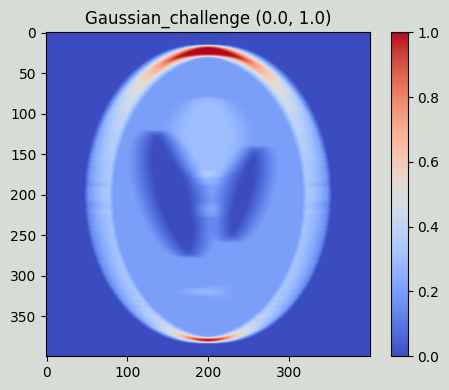

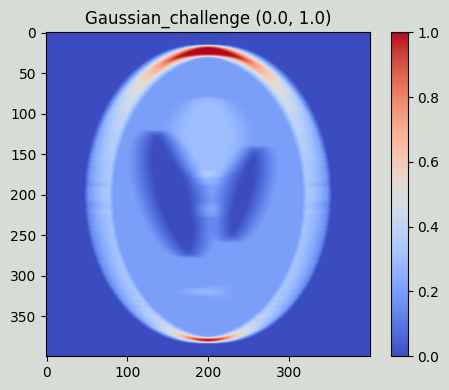

In [29]:
# def gaussian_blur(img: Tensor, kernel_size: List[int], sigma: List[float]) -> Tensor:
#     if not (isinstance(img, torch.Tensor)):
#         raise TypeError(f"img should be Tensor. Got {type(img)}")

#     _assert_image_tensor(img)

#     dtype = img.dtype if torch.is_floating_point(img) else torch.float32
#     kernel = _get_gaussian_kernel2d(kernel_size, sigma, dtype=dtype, device=img.device)
#     kernel = kernel.expand(img.shape[-3], 1, kernel.shape[0], kernel.shape[1])

#     img, need_cast, need_squeeze, out_dtype = _cast_squeeze_in(img, [kernel.dtype])
  
#     # padding = (left, right, top, bottom)
#     padding = [kernel_size[0] // 2, kernel_size[0] // 2, kernel_size[1] // 2, kernel_size[1] // 2]
#     img = torch_pad(img, padding, mode="reflect")
 
#     img = conv2d(img, kernel, groups=img.shape[-3])
#     img = _cast_squeeze_out(img, need_cast, need_squeeze, out_dtype)
#     return img

# class Gaussian_challenge(nn.Module):
#     def __init__(self, img: torch.Tensor, kernel_size: List[int], sigma: List[float], device: Optional[torch.device] = None) -> None:
#         super().__init__()
#         if not (isinstance(img, torch.Tensor)):
#             img = torch_reshape(img)
#         self.kernel_size = kernel_size
#         self.sigma = sigma
#         self.device = device if device is not None else torch.device("cpu")
#         self.dtype = img.dtype if torch.is_floating_point(img) else torch.float32
#         self.shape = list(img.shape)

#         self.kernel = _get_gaussian_kernel2d(kernel_size, sigma, dtype=self.dtype, device=device)
#         self.kernel = self.kernel.expand(self.shape[-3], 1, self.kernel.shape[0], self.kernel.shape[1])
#         img, self.need_cast, self.need_squeeze, out_dtype = _cast_squeeze_in(img, [self.kernel.dtype])
#         self.kernel = _cast_squeeze_out(self.kernel, self.need_cast, self.need_squeeze, out_dtype)
        
#         self.kernel = self.kernel.to(self.device)


#     def forward(self, img: Tensor) -> Tensor:
#         if not (isinstance(img, torch.Tensor)):
#             img = torch_reshape(img)
#         if self.shape != list(img.shape) or self.dtype != img.dtype or self.device != img.device:
#             Warning('img shape, dtype or device is not the same as the initialized one')
#             new_self = Gaussian_challenge(img, self.kernel_size, self.sigma, device = img.device)
#             padding = [new_self.kernel_size[0] // 2, new_self.kernel_size[0] // 2, new_self.kernel_size[1] // 2, new_self.kernel_size[1] // 2]
#             img = torch_pad(img, padding, mode="reflect")
#             blurred = conv2d(img, new_self.kernel, groups=img.shape[-3])
#             return _cast_squeeze_out(blurred, new_self.need_cast, new_self.need_squeeze, new_self.dtype)
#         else:
#             padding = [self.kernel_size[0] // 2, self.kernel_size[0] // 2, self.kernel_size[1] // 2, self.kernel_size[1] // 2]
#             img = torch_pad(img, padding, mode="reflect")
#             blurred = conv2d(img, self.kernel, groups=img.shape[-3])
#             return _cast_squeeze_out(blurred, self.need_cast, self.need_squeeze, self.dtype)
    
G = Gaussian_challenge(shepp_logan_phantom(), kernel_size=[31,21], sigma=[21,1])
visualize([G(shepp_logan_phantom())], title = ['Gaussian_challenge', 'Gaussian_filter'])

rows:  1 cols:  2


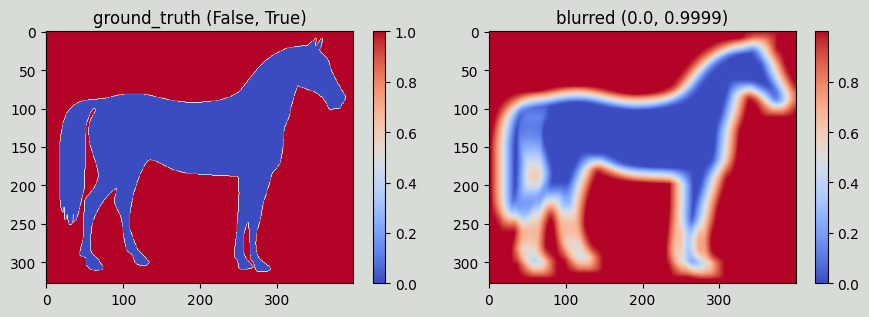

In [46]:
from skimage.data import horse
sigma = [21, 51]
gaussian_kernel_size = [31, 21]
ground_truth = horse()
gaussian_blurrer = Gaussian_challenge(ground_truth, kernel_size=gaussian_kernel_size, sigma=sigma)
blurred = tensor_to_np(gaussian_blurrer(ground_truth))

dict = {
    'image': blurred,
    'sigma': sigma,
    'gaussian_kernel_size': gaussian_kernel_size,
    'fresnel_number': 1e-3,
}

info = {
    'downsampling_factor': 1,
    'transform_factaor': 0.1,
    'transform_type': 'reshape',
    'mode': 'reflect',
    'value': 'min',
    'device': 'cuda:0',
    'iter_num': 1151,
    'abs_ratio': 1,
    'output_channel': 1,
    'output_num':1,
    'task': 'learn_gaussian',
    'seed': 49,
    'fc_depth': 0,
    'units': 256,
    'cnn_depth': 0,
    'dis_depth': 1,
    'stride':1,
    'depth':5,
    'apply_batchnorm': False,
    'normal_init': True,
    'ground_truth': horse(),
}

info.update(dict)
dataloader = Ganrec_Dataloader(**info)
ratio_names = ['l1_ratio', 'contrast_ratio', 'normalized_ratio', 'brightness_ratio', 'reg_l1_ratio', 'reg_l2_ratio', 'contrast_normalize_ratio', 'brightness_normalize_ratio', 'l2_ratio', 'fourier_ratio', 'norm_ratio', 'entropy_ratio', 'real_loss_ratio', 'fake_loss_ratio']
n = len(ratio_names)
all_available_ratios = generate_factors(n)
df = pd.DataFrame(all_available_ratios, columns=ratio_names)

all_ratios = []
for i in range(len(df)//2):
    all_ratios.append(df.iloc[i].to_dict())

g=visualize([dataloader.ground_truth, dataloader.transformed_images], title = ['ground_truth', 'blurred'])

rows:  2 cols:  3


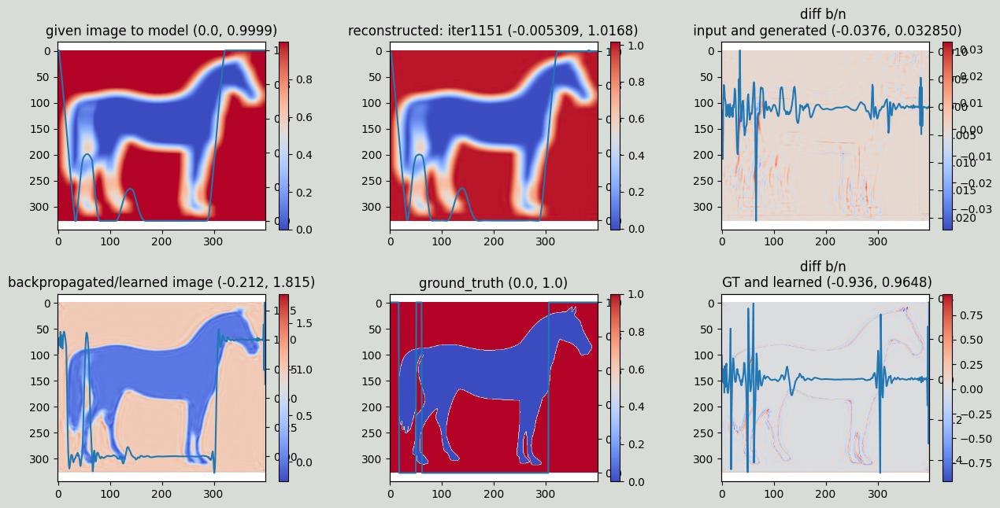

rows:  2 cols:  5
rows:  2 cols:  5


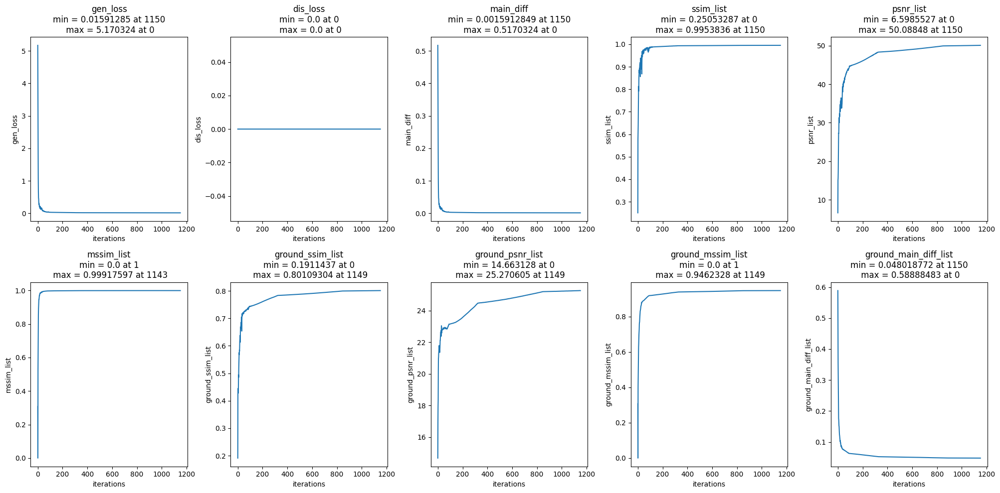

In [49]:
from utils import visualize
optim_ratio = all_ratios[93]
optim_ratio
optim_ratio['fake_loss_ratio'] = 1
optim_ratio['real_loss_ratio'] = 1
optim_ratio['entropy_ratio'] = 1
optim_ratio['norm_ratio'] = 0
optim_ratio['l1_ratio'] = 10
optim_ratio['l2_ratio'] = 0

optim_ratio['contrast_ratio'] = 0
optim_ratio['normalized_ratio'] = 0
optim_ratio['reg_l2_ratio'] = 1e-2
optim_ratio['reg_l1_ratio'] = 0
optim_ratio['contrast_normalize_ratio'] = 0

model = make_ganrec_model(**dataloader.__dict__)
# model.forward_gaussian(model.transformed_images)
# visualize([model.phase, model.attenuation, model.unblurred], title = ['phase', 'attenuation', 'propagated_intensity', 'unblurred'])
x = model.train(save_model = False, save_model_path = 'model/ganrec_model', **optim_ratio)
y = model.visualize(show_or_plot = 'both')

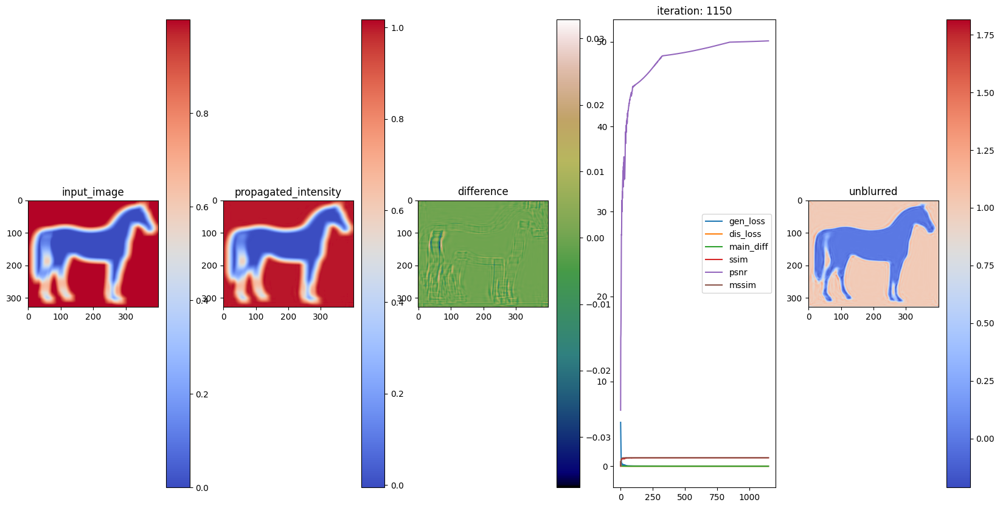

In [48]:
model.live_plot(rate=50)

In [423]:
optim_ratio = all_ratios[93]
optim_ratio
optim_ratio['fake_loss_ratio'] = 1
optim_ratio['real_loss_ratio'] = 1
optim_ratio['entropy_ratio'] = 1
optim_ratio['norm_ratio'] = 0
optim_ratio['l1_ratio'] = 10
optim_ratio['contrast_ratio'] = 0
optim_ratio['normalized_ratio'] = 0
optim_ratio['l2_reg_ratio'] = 0
optim_ratio['l1_reg_ratio'] = 0
optim_ratio['contrast_normalize_ratio'] = 1e-5

epoch 0 gen_loss:  tensor(2.9726, device='cuda:1', grad_fn=<AddBackward0>) dis_loss:  tensor(1.4643, device='cuda:1', grad_fn=<AddBackward0>) main_diff:  tensor(0.2311, device='cuda:1', grad_fn=<MeanBackward0>) t_epoch:  0.22779107093811035 remaining time:  45 seconds ssim:  -0.23885982 psnr:  7.110799
epoch 65 gen_loss:  tensor(0.7618, device='cuda:1', grad_fn=<AddBackward0>) dis_loss:  tensor(1.4878, device='cuda:1', grad_fn=<AddBackward0>) main_diff:  tensor(0.0106, device='cuda:1', grad_fn=<MeanBackward0>) t_epoch:  13.852939128875732 remaining time:  30 seconds ssim:  0.8680676 psnr:  32.436657
epoch 131 gen_loss:  tensor(0.7744, device='cuda:1', grad_fn=<AddBackward0>) dis_loss:  tensor(1.4933, device='cuda:1', grad_fn=<AddBackward0>) main_diff:  tensor(0.0117, device='cuda:1', grad_fn=<MeanBackward0>) t_epoch:  28.480906009674072 remaining time:  15 seconds ssim:  0.86943686 psnr:  31.43126
epoch 197 gen_loss:  tensor(0.7797, device='cuda:1', grad_fn=<AddBackward0>) dis_loss:  t

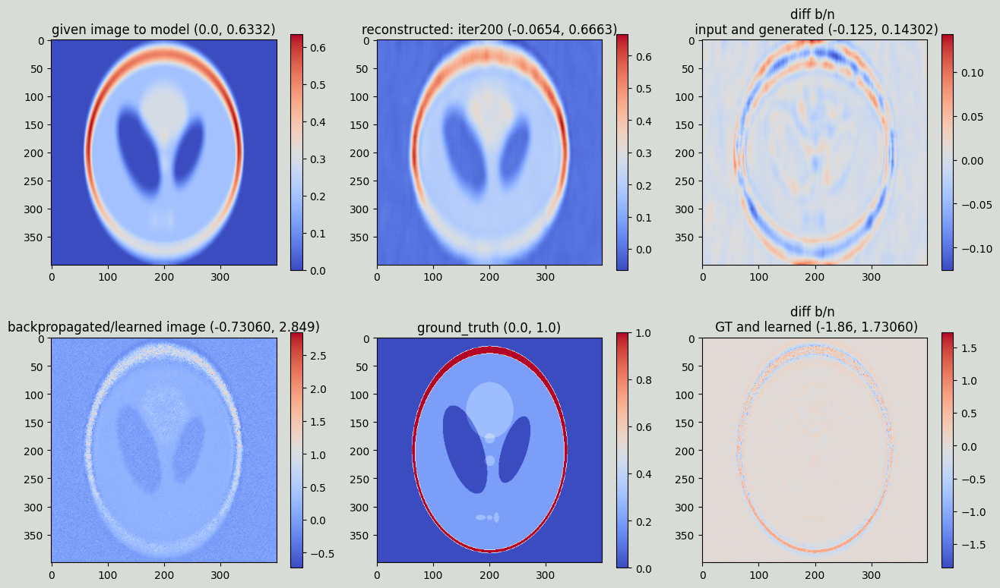

rows:  2 cols:  5


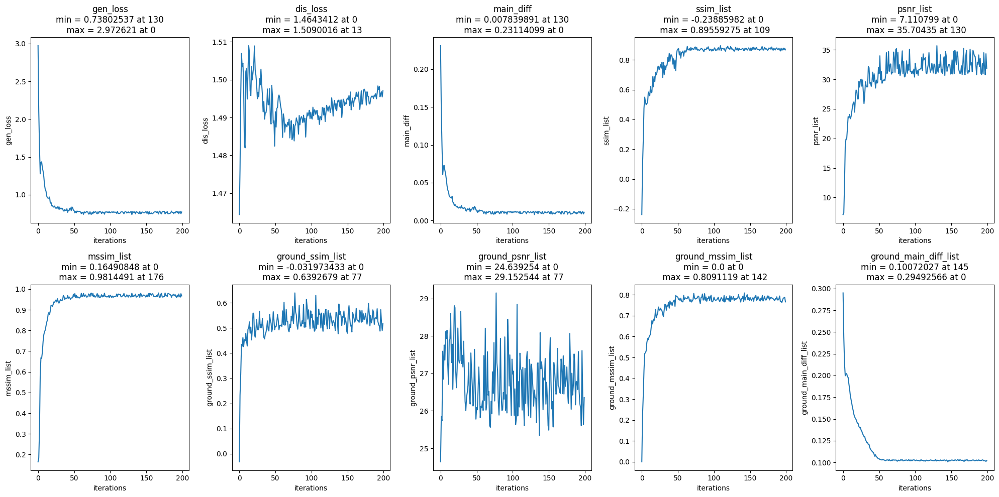

In [424]:
model = make_ganrec_model(**dataloader.__dict__)
x = model.train(save_model = False, save_model_path = 'model/ganrec_model', **optim_ratio)
model.visualize()

In [ ]:
model = make_ganrec_model(**dataloader.__dict__)
x = model.refine_parameters_using_condition(condition='l1_ratio', values=1, ratio=all_ratios, show_images=True, plot_pd=True)

epoch 0 gen_loss:  tensor(nan, device='cuda:1', grad_fn=<AddBackward0>) dis_loss:  tensor(0.9318, device='cuda:1', grad_fn=<AddBackward0>) main_diff:  tensor(0.5281, device='cuda:1', grad_fn=<MeanBackward0>) t_epoch:  0.1142427921295166 remaining time:  5 seconds ssim:  -0.23839855 psnr:  8.250396
epoch 49 gen_loss:  tensor(0.0129, device='cuda:1', grad_fn=<AddBackward0>) dis_loss:  tensor(0.8586, device='cuda:1', grad_fn=<AddBackward0>) main_diff:  tensor(2.0869, device='cuda:1', grad_fn=<MeanBackward0>) t_epoch:  5.40267276763916 remaining time:  0 seconds ssim:  0.88002664 psnr:  26.30762
gen_loss:  0.012888199 dis_loss:  0.85861194 main_diff:  2.086914
epoch 0 gen_loss:  tensor(nan, device='cuda:1', grad_fn=<AddBackward0>) dis_loss:  tensor(1.4944, device='cuda:1', grad_fn=<AddBackward0>) main_diff:  tensor(0.6246, device='cuda:1', grad_fn=<MeanBackward0>) t_epoch:  0.11913800239562988 remaining time:  5 seconds ssim:  -0.23839855 psnr:  8.250396
epoch 49 gen_loss:  tensor(nan, dev

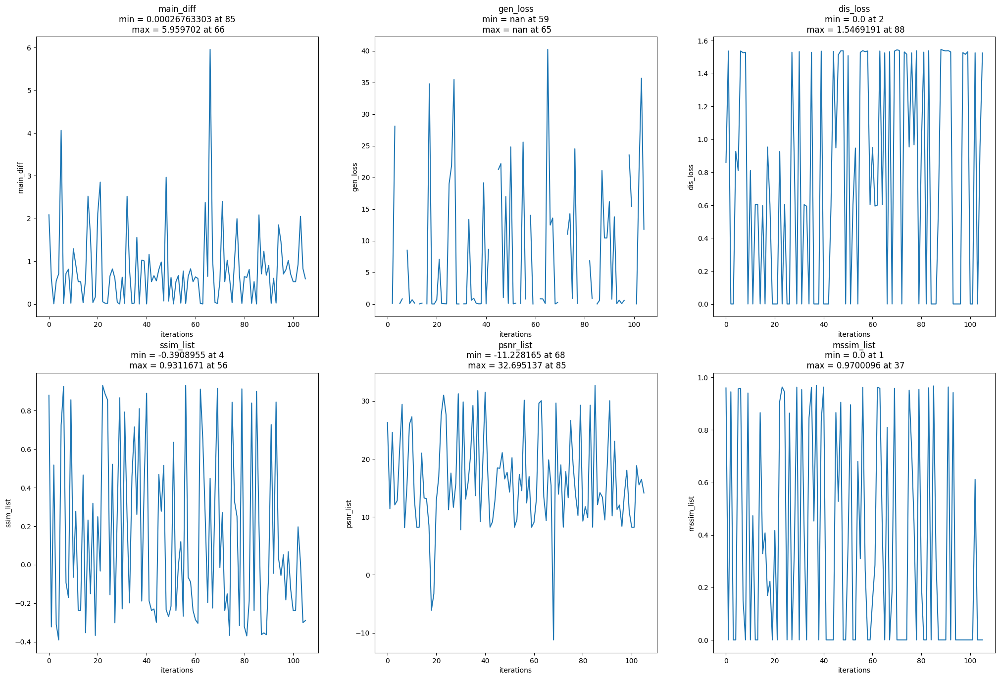

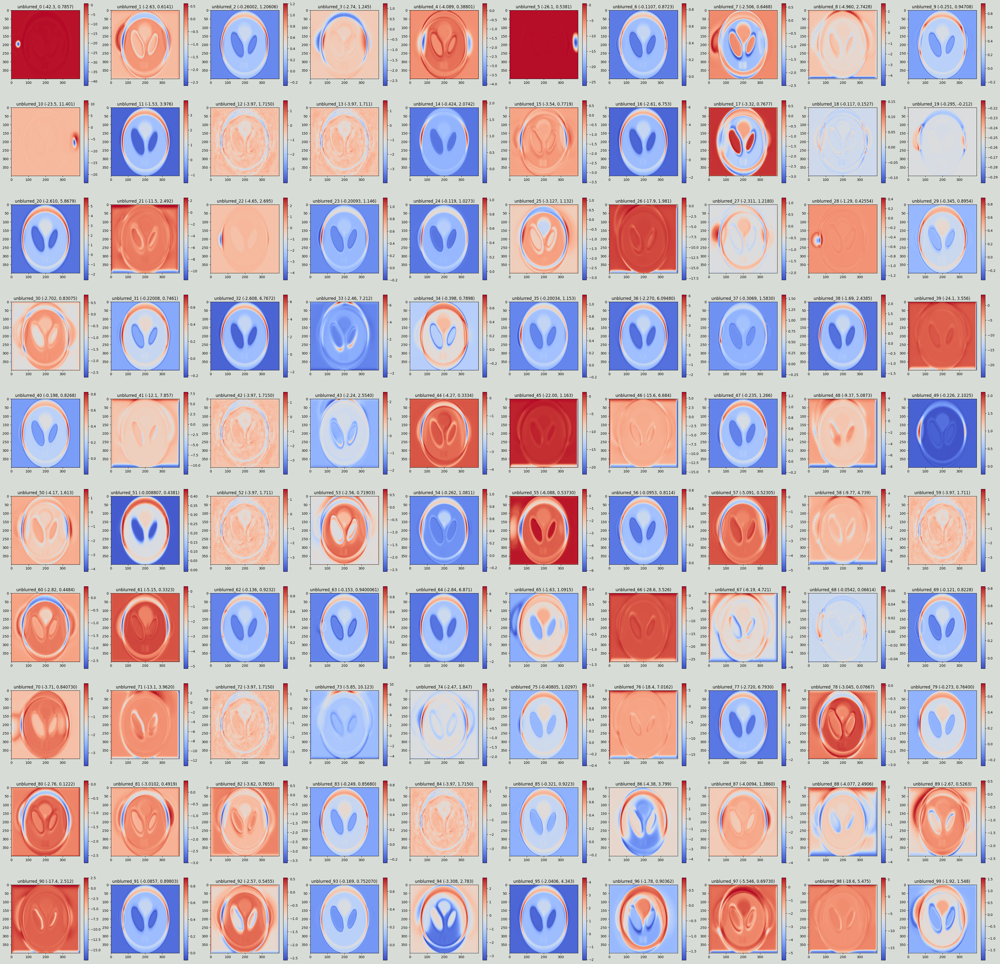

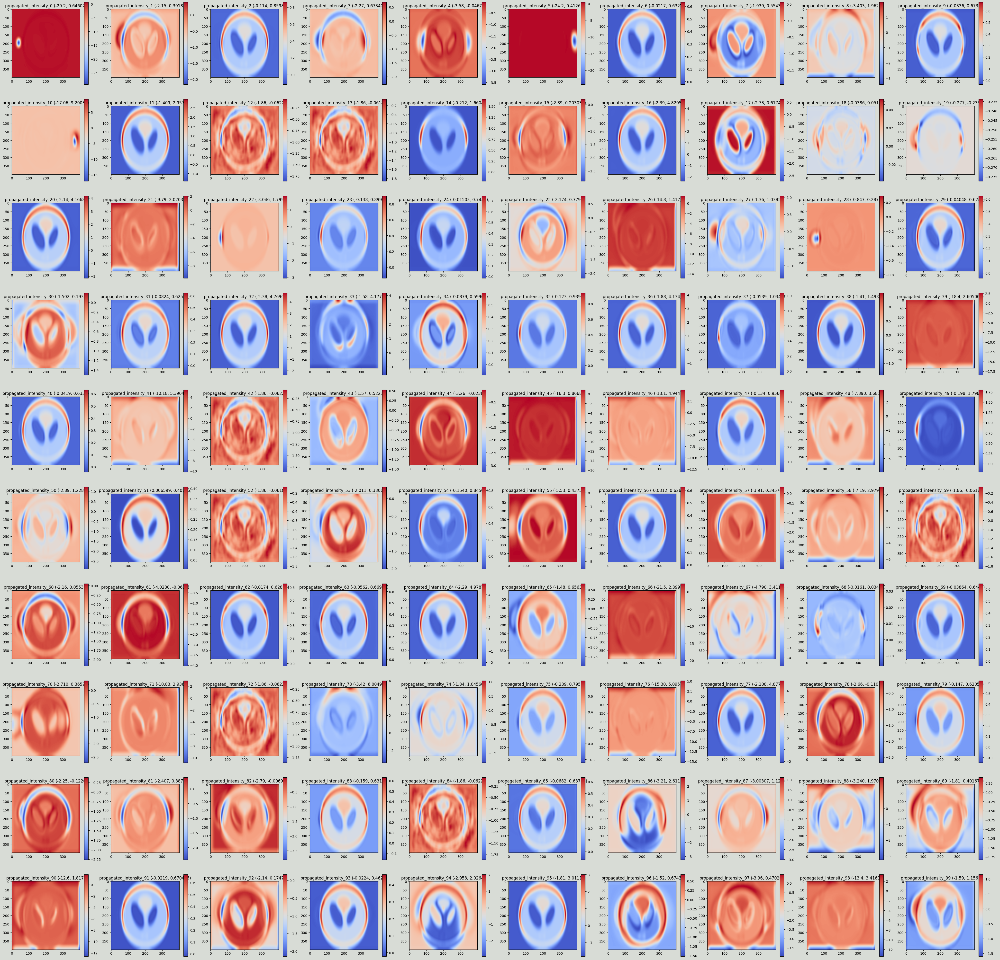

In [101]:
model = make_ganrec_model(**dataloader.__dict__)
x = model.refine_parameters_using_condition(condition='l1_ratio', values=1, ratio=all_ratios, show_images=True, plot_pd=True)

In [96]:
x[-1]

([array(2.244598, dtype=float32),
  array(39.811478, dtype=float32),
  array(1.5416524, dtype=float32),
  array(0.8845332, dtype=float32),
  array(24.779882, dtype=float32),
  array(0.9484225, dtype=float32)],
 [0, 3, 1, 0, 2, 2])